Improving Image Classification with Deep Convolutional GAN Data AugmentationImproving Image Classification with Deep Convolutional GAN Data Augmentation

# **Classification**

In [ ]:
import os
import torch
import random
import torchvision
import numpy as np
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torchvision.transforms.transforms import GaussianBlur
from torchvision.io import read_image
from torchvision import datasets
import torchvision.utils as vutils
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch import optim
!pip install scikit-learn
from sklearn.metrics import precision_score, recall_score, f1_score

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cpu device


In [ ]:
# Configuration 
batch_size = 4
epochs = 80
workers = 2
lr = 0.01

In [ ]:
test_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Test')
train_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Augmented_Train2')

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None, classification = True):
        self.img_dir = img_dir
        self.labels = {}
        self.img_paths = []
        self.img_labels = []
        self.transform = transform
        self.target_transform = target_transform
        self.classification = classification

        if self.classification:
            for i, subdir in enumerate(os.listdir(self.img_dir)):
                # Define the classes
                self.labels[subdir] = i

                # Get the path and label of each image in each sub-directory
                subdir_path = os.path.join(self.img_dir, subdir)
                for path in os.listdir(subdir_path):
                    if path.endswith(".png"):
                        self.img_paths.append(os.path.join(subdir_path, path))
                        self.img_labels.append(i)
        else: 
            for path in os.listdir(img_dir):
                if path.endswith(".png"):
                        self.img_paths.append(os.path.join(img_dir, path))
                self.img_labels.append(0 if os.path.split(self.img_dir)[-1]=='Cow' else 1)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        label = self.img_labels[idx]

        # Load the image
        if self.classification:
            image = read_image(img_path).type(torch.float)
        else:
            image = read_image(img_path).type(torch.uint8)

        # Apply the transforms
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)

        return image, label

In [ ]:
# Transform used for the original run
base_transform=transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64,64)),
    transforms.ToTensor()])

# Transform used for the visualization of the data
visualize_transform = transforms.Resize((64,64))

# Transform used for data augmentation 
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64,64)),
    transforms.ToTensor(),
    transforms.GaussianBlur(3, sigma=(0.1, 2.0)),
    transforms.RandomRotation(degrees = 90),
    transforms.ColorJitter(brightness = 0.75, hue = 0.5),
    transforms.Normalize(mean = [0,0,0], std = [1,1,1])])

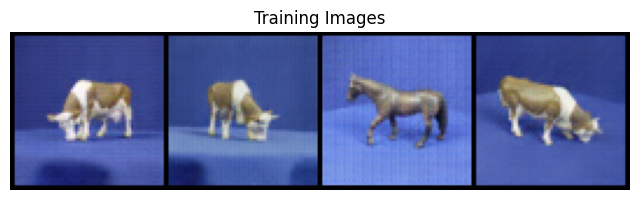

In [ ]:
# Plot some training images
trainset = CustomImageDataset(train_path,transform = visualize_transform, target_transform= None) 
trainloader = torch.utils.data.DataLoader(trainset, batch_size = batch_size, shuffle=True, num_workers=workers)

images, labels = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(images.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

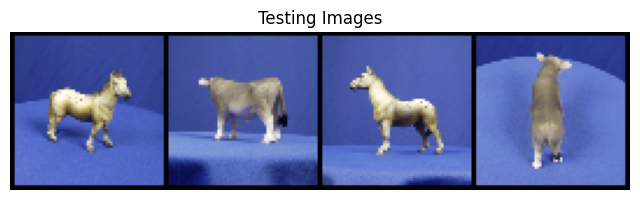

In [ ]:
# Plot some testing images
testset = CustomImageDataset(test_path,transform = visualize_transform, target_transform = None)
testloader = torch.utils.data.DataLoader(testset, batch_size = batch_size, shuffle=True, num_workers=workers)

images, labels = next(iter(testloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Testing Images")
plt.imshow(np.transpose(vutils.make_grid(images.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
# Classification Data
trainset = CustomImageDataset(train_path,transform = transform, target_transform= None) 
trainloader = torch.utils.data.DataLoader(trainset, batch_size = batch_size, shuffle=True, num_workers=workers)

testset = CustomImageDataset(test_path,transform = transform, target_transform = None)
testloader = torch.utils.data.DataLoader(testset, batch_size = batch_size, shuffle=True, num_workers=workers)


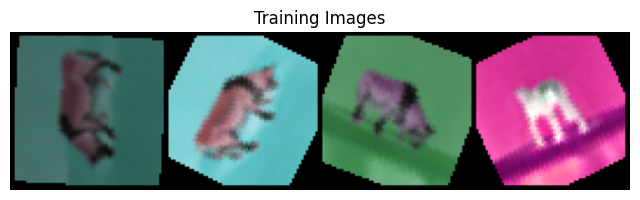

In [ ]:
# Plotting training images after applying transforms
images, labels = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(images.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 5)
        self.pool = nn.MaxPool2d(4)
        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 8, kernel_size = 3)
        self.pool2 = nn.MaxPool2d(2)
        self.Relu = nn.ReLU()
        self.flatten = nn.Flatten()
        self.FC1 = nn.Linear(6*6*8,144)
        self.FC2 = nn.Linear(144,2)

    def forward(self, x):
        x = self.Relu(self.conv1(x))
        x = self.pool(x)
        x = self.Relu(self.conv2(x))
        x = self.pool2(x)
        x = self.flatten(x)
        x = self.FC1(x.view(-1,288)) 
        x = nn.functional.softmax(self.FC2(x), dim=1)
        return x

In [ ]:
net = Net()
net.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=lr)

print(net)

Net(
  (conv1): Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Relu): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (FC1): Linear(in_features=288, out_features=144, bias=True)
  (FC2): Linear(in_features=144, out_features=2, bias=True)
)


In [ ]:
# Manual Seed for Repeatability
manualSeed = 1247
# manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)

random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  1247


In [ ]:
# Initialize the metrics: We evaluate the loss, accuracy, precision, recall, f1 score
# vs. the number of epochs in both the train and test loop 
loss_train = []
acc_train = []
precision_train = []
recall_train = []
f1_train = []

loss_test = []
acc_test = []
precision_test = []
recall_test = []
f1_test = []


In [ ]:
# Training Loop:

for epoch in range(epochs): 

    # Training and Evaluating Loss, Accuracy, Precision, Recall, and f1 score on Train Set
    running_loss_train = 0.0
    correct_train = 0
    total_train = 0
    predicted_train = []
    actual_train = []

    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()  

        # forward + backward + optimize
        outputs = net(inputs.to(device))
        loss = criterion(outputs, labels.to(device).long()) 
        loss.backward() 
        optimizer.step() 
        
        # print statistics
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels.to(device)).sum().item()

        predicted_train.extend(predicted.tolist())
        actual_train.extend(labels.tolist())

        running_loss_train += loss.item()
        if i % 20 == 19: # print every 20 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss_train / 20))
            
    epoch_loss_train = running_loss_train / len(trainloader)
    epoch_acc_train = 100 * correct_train / total_train
    loss_train.append(epoch_loss_train)
    acc_train.append(epoch_acc_train)

    precision_train.append(precision_score(actual_train, predicted_train, average='weighted',zero_division = 0))
    recall_train.append(recall_score(actual_train, predicted_train, average='weighted',zero_division = 0))
    f1_train.append(f1_score(actual_train, predicted_train, average='weighted',zero_division = 0))


    # Evaluating Loss, Accuracy, Precision, Recall, and f1 score on Test Set
    running_loss_test = 0.0
    correct_test = 0
    total_test = 0
    predicted_test = []
    actual_test = []

    # since we're not training, we don't need to calculate the gradients for our outputs
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device,dtype = torch.float)

            # calculate outputs and the loss by running images through the network
            outputs = net(images)
            loss = criterion(outputs, labels.to(device))

            # the class with the highest energy is what we choose as prediction
            running_loss_test += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels.to(device)).sum().item()

            predicted_test.extend(predicted.tolist())
            actual_test.extend(labels.tolist())
        
        epoch_loss_test = running_loss_test / len(testloader)
        epoch_acc_test = 100 * correct_test / total_test
        loss_test.append(epoch_loss_test)
        acc_test.append(epoch_acc_test)

        precision_test.append(precision_score(actual_test, predicted_test, average='weighted',zero_division = 0))
        recall_test.append(recall_score(actual_test, predicted_test, average='weighted',zero_division = 0))
        f1_test.append(f1_score(actual_test, predicted_test, average='weighted',zero_division = 0))


print('Finished Training')
print(f'Accuracy of the network on the train images: {100 * correct_train // total_train} %')
print(f'Accuracy of the network on the test images: {100 * correct_test // total_test} %')

In [ ]:
# NEW:
# Raw Data Without Transform:
# Original: Train Set: 100 %, Test Set: 52 % Epochs: 80
# base_model_59: Train Set: 92 % Test Set: 59 % Epochs: 40

# Data With Transform:
# transform_model_58: Train Set: 93 % Test Set: 58 % Epochs: 80

# Data augmentation with GAN: 
# GAN_aug_58: Train Set: 95 %, Test Set: 58 % Epochs: 80 Augmented Train Set without transform
# GAN1_aug_63: Train Set: 95 %, Test Set: 63 % Epochs: 20 Augmented Train Set without transform
# GAN_aug_62: Train Set: 97 % Test Set: 62 % Epochs: 20 -- Augmented Train Set 2 without transform 
# GAN_aug_63: Train Set: 97 % Test Set: 63 % Epochs: 80 -- Augmented Train Set 2 without transform
# GAN_aug_transform: Train Set: 97 % Test Set 56% Epochs: 80 -- Augmented Train Set 2 with transform

In [ ]:
from sklearn.metrics._plot.precision_recall_curve import precision_recall_curve
# Saving the model:
model_name = ''
torch.save({
            'epoch': epoch,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),

            'train loss': loss_train,
            'train accuracy': acc_train,
            'train precision': precision_train,
            'train recall': recall_train,
            'train f1 score': f1_train,

            'test loss': loss_test,
            'test accuracy' : acc_test,
            'test precision': precision_test,
            'test recall': recall_test,
            'test f1 score': f1_test

            }, os.path.join('drive','MyDrive', 'GAN','Saved_models',f'{model_name}.pth'))

In [ ]:
# Load back the model:
model_name ='GAN_aug_63'
NewType = Net()
optimizer = optim.SGD(net.parameters(), lr=lr)

checkpoint = torch.load(os.path.join('drive','MyDrive', 'GAN','Saved_models',f'{model_name}.pth'),map_location=torch.device('cpu'))
epoch = checkpoint['epoch']
net.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
loss_train = checkpoint['train loss']
acc_train = checkpoint['train accuracy']
precision_train = checkpoint['train precision']
recall_train = checkpoint['train recall']
f1_train = checkpoint['train f1 score']
loss_test = checkpoint['test loss']
acc_test = checkpoint ['test accuracy']
precision_test = checkpoint['test precision']
recall_test = checkpoint['test recall']
f1_test = checkpoint['test f1 score']

net.eval()
# - or -
# net.train()

Net(
  (conv1): Conv2d(3, 16, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Relu): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (FC1): Linear(in_features=288, out_features=144, bias=True)
  (FC2): Linear(in_features=144, out_features=2, bias=True)
)

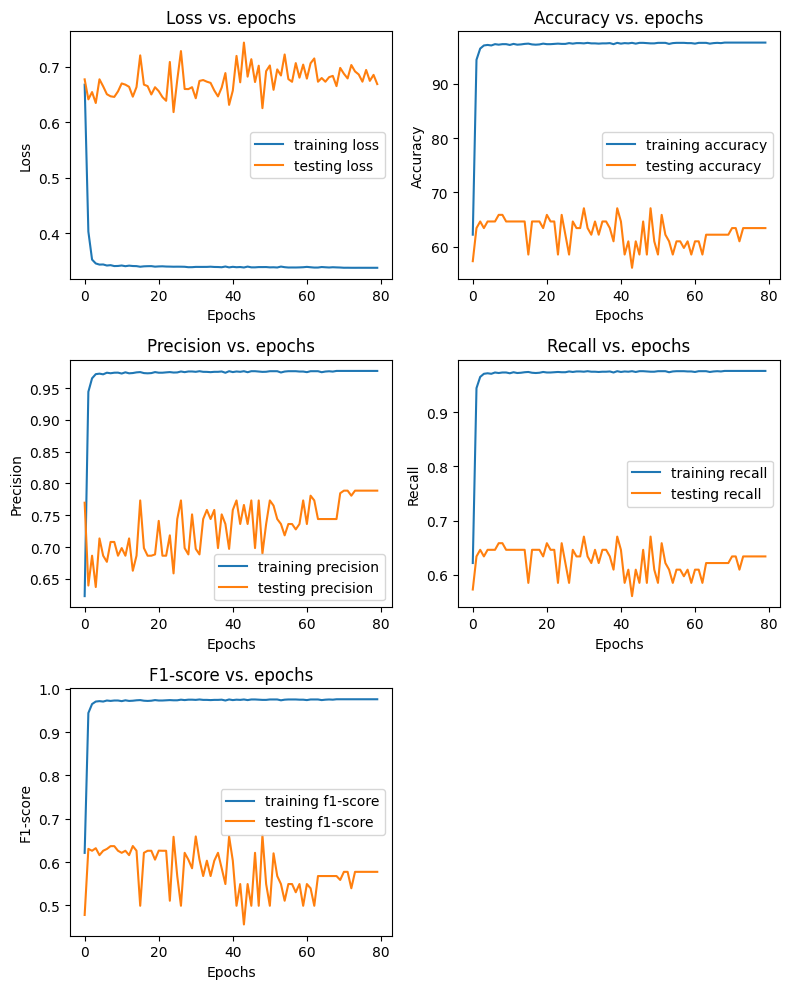

In [ ]:
# Create subplots of the classification metrics
fig, axs = plt.subplots(3, 2, figsize=(8,10))

# Plot the loss vs. epochs
axs[0, 0].plot(loss_train, label='training loss')
axs[0, 0].plot(loss_test, label='testing loss')
axs[0, 0].set_title('Loss vs. epochs')
axs[0, 0].set_xlabel('Epochs')
axs[0, 0].set_ylabel('Loss')
axs[0, 0].legend()

# Plot the accuracy vs. epochs
axs[0, 1].plot(acc_train, label='training accuracy')
axs[0, 1].plot(acc_test, label='testing accuracy')
axs[0, 1].set_title('Accuracy vs. epochs')
axs[0, 1].set_xlabel('Epochs')
axs[0, 1].set_ylabel('Accuracy')
axs[0, 1].legend()

# Plot the precision vs. epochs
axs[1, 0].plot(precision_train, label='training precision')
axs[1, 0].plot(precision_test, label='testing precision')
axs[1, 0].set_title('Precision vs. epochs')
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Precision')
axs[1, 0].legend()

# Plot the recall vs. epochs
axs[1, 1].plot(recall_train, label='training recall')
axs[1, 1].plot(recall_test, label='testing recall')
axs[1, 1].set_title('Recall vs. epochs')
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylabel('Recall')
axs[1, 1].legend()

# Plot the f1-score vs. epochs
axs[2, 0].plot(f1_train, label='training f1-score')
axs[2, 0].plot(f1_test, label='testing f1-score')
axs[2, 0].set_title('F1-score vs. epochs')
axs[2, 0].set_xlabel('Epochs')
axs[2, 0].set_ylabel('F1-score')
axs[2, 0].legend()

# Hide the last subplot
axs[2, 1].axis('off')

plt.tight_layout()
plt.show()

# **DCGAN**

In [ ]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.io import read_image
%matplotlib inline
from __future__ import print_function

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cpu device


In [ ]:
# Configuration
# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 1

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 10

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 800

# Learning rate for optimizers
lr_g = 0.0002
lr_d = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None, classification = True):
        self.img_dir = img_dir
        self.labels = {}
        self.img_paths = []
        self.img_labels = []
        self.transform = transform
        self.target_transform = target_transform
        self.classification = classification

        if self.classification:
            for i, subdir in enumerate(os.listdir(self.img_dir)):
                # Define the classes
                self.labels[subdir] = i

                # Get the path and label of each image in each sub-directory
                subdir_path = os.path.join(self.img_dir, subdir)
                for path in os.listdir(subdir_path):
                    if path.endswith(".png"):
                        self.img_paths.append(os.path.join(subdir_path, path))
                        self.img_labels.append(i)
        else: 
            for path in os.listdir(img_dir):
                if path.endswith(".png"):
                        self.img_paths.append(os.path.join(img_dir, path))
                self.img_labels.append(0 if os.path.split(self.img_dir)[-1]=='Cow' else 1)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        label = self.img_labels[idx]

        # Load the image
        if self.classification:
            image = read_image(img_path).type(torch.float)
        else:
            image = read_image(img_path).type(torch.uint8)

        # Apply the transforms
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)

        return image, label

In [ ]:
cow_test_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Test','Cow')
cow_train_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Train','Cow')

horse_test_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Test','Horse')
horse_train_path = os.path.join('drive','MyDrive', 'GAN','Newdata','Train','Horse')

In [ ]:
#base_transform = transforms.Resize(64)
transform=transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((64,64)),
    transforms.ToTensor()])

cow_trainset = CustomImageDataset(cow_train_path, transform =transform,target_transform=None, classification = False)
cow_trainloader = torch.utils.data.DataLoader(cow_trainset, batch_size=batch_size, shuffle=True, num_workers=workers)

horse_trainset = CustomImageDataset(horse_train_path, transform = transform,target_transform=None, classification = False)
horse_trainloader = torch.utils.data.DataLoader(horse_trainset, batch_size=batch_size, shuffle=True, num_workers=workers)

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(10, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
# Initialize BCELoss function
loss = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(8,nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizer_D = optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizer_G = optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

Starting Training Loop...


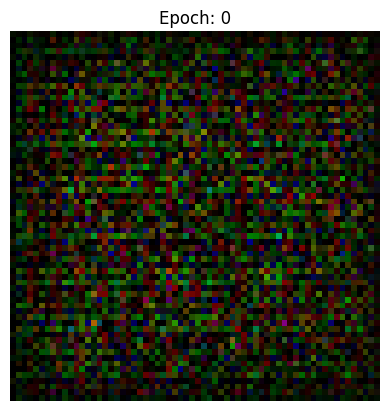

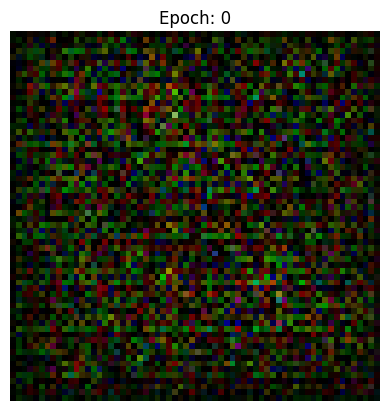

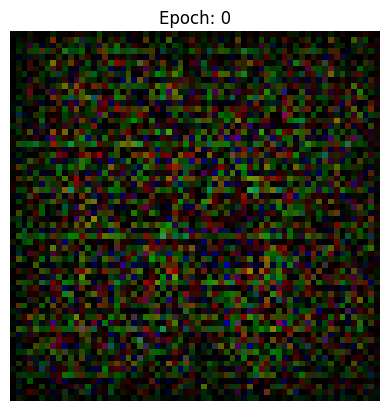

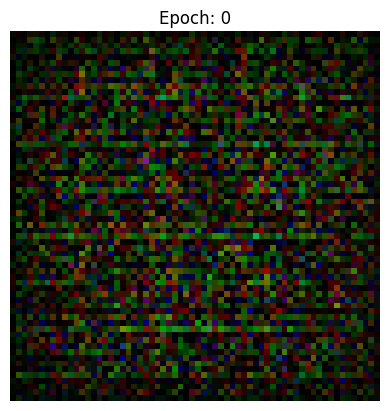

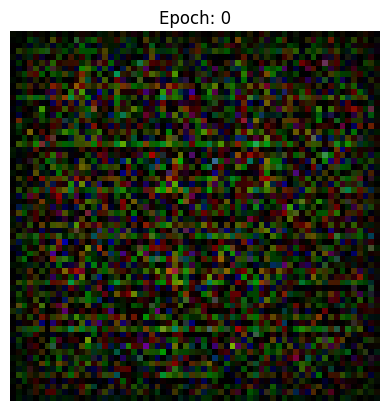

...

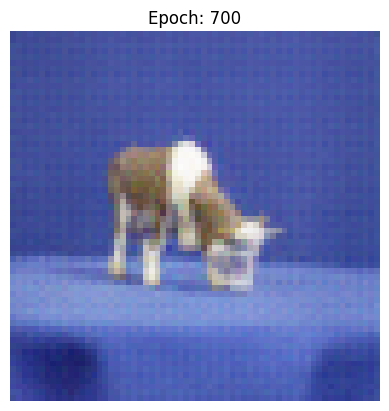

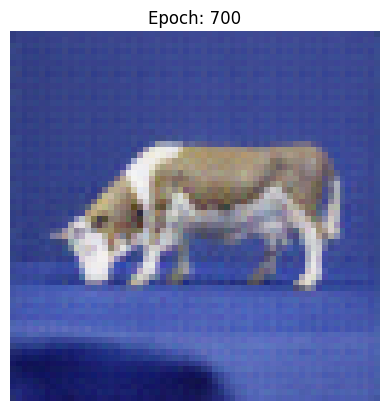

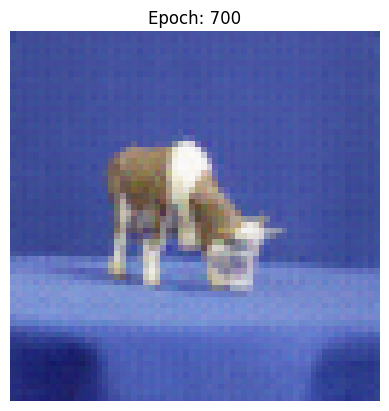

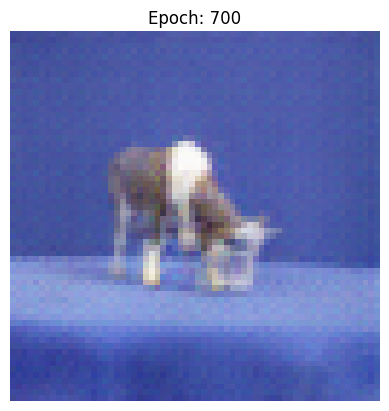

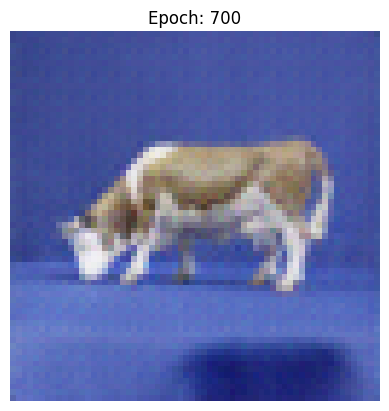

KeyboardInterrupt: ignored

In [ ]:
# Training Loop:
print("Starting Training Loop...")

img_list = []
G_losses = []
D_losses = []
iters = 0
for epoch in range(num_epochs):

  running_loss_D = 0.0
  for i, data in enumerate(cow_trainloader, 0):

    ##########################
    ## Update Discriminator ##
    ##########################  

    ''' 
    Loss on Real Images
  
    '''
    inputs, b = data
    netD.zero_grad()
    predicted = netD(inputs.to(device))
    labels = torch.ones(len(b), 1, 1,1, dtype=torch.float, device=device)# real 
    loss_real = loss(predicted, labels.to(device))
    loss_real.backward()

    ''' 
    Loss on fake Images
  
    '''
    noise = torch.randn(batch_size, nz, 1, 1)
    fake_image = netG(noise.to(device))
    predicted = netD(fake_image.detach())
    target = torch.zeros(batch_size,1, 1, 1, dtype=torch.float, device=device)# fake 
    loss_fake = loss(predicted, target)
    loss_fake.backward()

    loss_discriminator = loss_real + loss_fake
    optimizer_D.step()
    

    ##########################
    #### Update Generator ####
    ##########################

    optimizer_G.zero_grad()
    predicted = netD(fake_image)
    target = torch.ones(batch_size,1,1,1, dtype=torch.float, device=device)# real for the generator
    loss_generator = loss(predicted, target)
    loss_generator.backward()
    optimizer_G.step()


    #############################
    #### Training Statistics ####
    #############################

    # Save Losses for plotting later
    G_losses.append(loss_generator.item())
    D_losses.append(loss_discriminator.item())

    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(horse_trainloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
  
    ####################################
    #### Plot some Generator images ####
    ####################################

    # during every epoch, print images at every 10th iteration.
    if epoch % 100 == 0:
        noise = torch.randn(1, nz, 1,1)
        z = netG(noise.to(device))
        z = z.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        plt.imshow(z)
        plt.axis("off")
        plt.title("Epoch: " + str(epoch))
        plt.show()
    
    iters += 1

print('Finished Training')

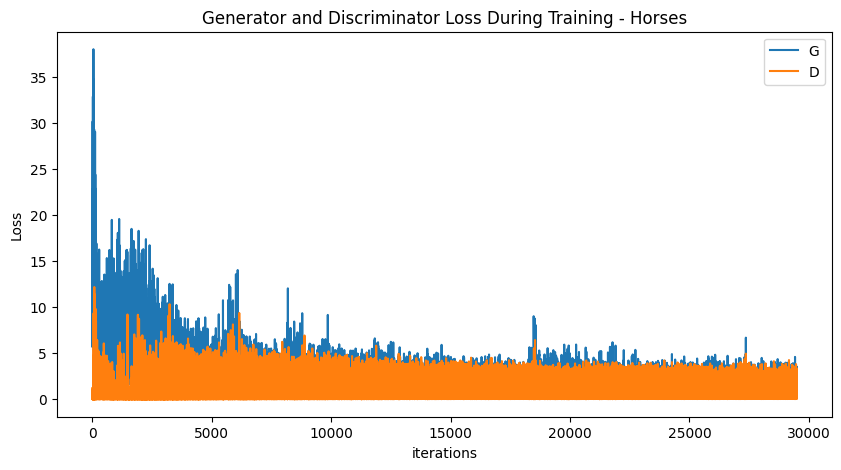

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training - Horses")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

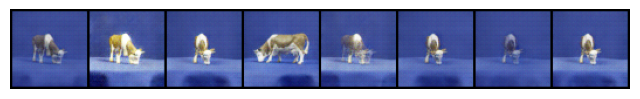

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
# #Generating Images and saving them

from torchvision.utils import save_image
for i in range (100):
  %matplotlib inline 
  noise = torch.randn(1, nz, 1, 1, device=device)
  fake_img= netG(noise.to(device))
  #save_image(fake_img,f'/content/drive/MyDrive/GAN/Newdata/Train/Generated_Horses/{i+400}.png')
  fake_img=fake_img.cpu().detach().squeeze().permute(1,2,0).numpy()
  plt.axis("off")
  plt.title("Generated Image")
  plt.imshow(fake_img)
  plt.show()